# Анализ маркетплейса

## Данные 

В этом домашнем задании вам придется оказаться на месте аналитика в бразильском маркетплейсе [Olist](https://olist.com/pt-br/). Вам необходимо исследовать данные и на их основании сделать выводы, которые помогут бизнесу расцветать!

Данные находятся тут: (будет ссылка)

Ван дано 9 датасетов, которые содержат в себе все данные по 100 000 заказам со всей Бразилии. Чтобы облегчить вам жизнь, вот связи по этим датасетам (файл product_category_name_translation является переводом названий категорий с португальского на английский)

![](https://i.imgur.com/HRhd2Y0.png)

Ну что же, начнем, пожалуй!

In [103]:
import pandas as pd
import numpy as np
import datetime
import dateutil
import warnings

import matplotlib.pyplot as plt
import seaborn as sns
import plotly.graph_objects as go
import plotly.express as px
from plotly.subplots import make_subplots

In [104]:
warnings.simplefilter('ignore',UserWarning)

In [9]:
!wget https://github.com/Palladain/Deep_Python/raw/main/Homeworks/Homework_1/archive.zip

--2023-04-26 20:52:56--  https://github.com/Palladain/Deep_Python/raw/main/Homeworks/Homework_1/archive.zip
Распознаётся github.com (github.com)… 140.82.121.3
Подключение к github.com (github.com)|140.82.121.3|:443... соединение установлено.
HTTP-запрос отправлен. Ожидание ответа… 302 Found
Адрес: https://raw.githubusercontent.com/Palladain/Deep_Python/main/Homeworks/Homework_1/archive.zip [переход]
--2023-04-26 20:52:57--  https://raw.githubusercontent.com/Palladain/Deep_Python/main/Homeworks/Homework_1/archive.zip
Распознаётся raw.githubusercontent.com (raw.githubusercontent.com)… 185.199.110.133, 185.199.108.133, 185.199.109.133, ...
Подключение к raw.githubusercontent.com (raw.githubusercontent.com)|185.199.110.133|:443... соединение установлено.
HTTP-запрос отправлен. Ожидание ответа… 200 OK
Длина: 44717580 (43M) [application/zip]
Сохранение в: ‘archive.zip’

archive.zip         100%[===================>]  42,65M  1,83MB/s    за 2m 33s  

2023-04-26 20:55:32 (286 KB/s) - ‘archive.

In [10]:
!unzip archive.zip

Archive:  archive.zip
  inflating: olist_customers_dataset.csv  
  inflating: olist_geolocation_dataset.csv  
  inflating: olist_order_items_dataset.csv  
  inflating: olist_order_payments_dataset.csv  
  inflating: olist_order_reviews_dataset.csv  
  inflating: olist_orders_dataset.csv  
  inflating: olist_products_dataset.csv  
  inflating: olist_sellers_dataset.csv  
  inflating: product_category_name_translation.csv  


In [11]:
customers = pd.read_csv('olist_customers_dataset.csv')
geolocation = pd.read_csv('olist_geolocation_dataset.csv')
order_items = pd.read_csv('olist_order_items_dataset.csv')
order_payments = pd.read_csv('olist_order_payments_dataset.csv')
order_reviews = pd.read_csv('olist_order_reviews_dataset.csv')
orders = pd.read_csv('olist_orders_dataset.csv')
products = pd.read_csv('olist_products_dataset.csv')
sellers = pd.read_csv('olist_sellers_dataset.csv')
product_category = pd.read_csv('product_category_name_translation.csv')

In [12]:
print(customers.isna().sum().sum())
print(geolocation.isna().sum().sum())
print(order_items.isna().sum().sum())
print(order_payments.isna().sum().sum())
print(order_reviews.isna().sum().sum())
print(orders.isna().sum().sum())
print(products.isna().sum().sum())
print(sellers.isna().sum().sum())
print(product_category.isna().sum().sum())

0
0
0
0
145903
4908
2448
0
0


In [13]:
geolocation = geolocation.drop_duplicates()
customers = customers.drop_duplicates()
order_items = order_items.drop_duplicates()
order_payments = order_payments.drop_duplicates()
order_reviews = order_reviews.drop_duplicates()
orders = orders.drop_duplicates()
products = products.drop_duplicates()
sellers = sellers.drop_duplicates()
product_category = product_category.drop_duplicates()

In [14]:
products.isna().sum()

product_id                      0
product_category_name         610
product_name_lenght           610
product_description_lenght    610
product_photos_qty            610
product_weight_g                2
product_length_cm               2
product_height_cm               2
product_width_cm                2
dtype: int64

У многих продуктов отсутствуют данные о категории, длине названия и длине описания, для того чтобы выделить продукты без категории в отдельную группу и не потерять информацию о них, заполним пропуски в `product_category_name` на значение "No category"

In [15]:
products['product_category_name'] = products['product_category_name'].fillna('No category')

In [16]:
orders.isna().sum()

order_id                            0
customer_id                         0
order_status                        0
order_purchase_timestamp            0
order_approved_at                 160
order_delivered_carrier_date     1783
order_delivered_customer_date    2965
order_estimated_delivery_date       0
dtype: int64

In [17]:
orders[orders.isna().any(axis = 1)].order_status.value_counts()

shipped        1107
canceled        619
unavailable     609
invoiced        314
processing      301
delivered        23
created           5
approved          2
Name: order_status, dtype: int64

У многих заказов отсутствуют данные о фактическом времени: подтверждения, доставки к перевозчику, клиенту, в основном это те заказы, которые все еще не получены или же отменены

In [18]:
order_reviews.isna().sum()

review_id                      0
order_id                       0
review_score                   0
review_comment_title       87656
review_comment_message     58247
review_creation_date           0
review_answer_timestamp        0
dtype: int64

Пропуски есть только в столбцах с информацией о тексте отзыва на заказ, заполним эти пропуски значениями "No title" и "No message" соответственно

In [19]:
order_reviews['review_comment_title'] = order_reviews.review_comment_title.fillna('No title')
order_reviews['review_comment_message'] = order_reviews.review_comment_message.fillna('No message')

## Задание 1

Определите:

* Число товаров
* Среднюю стоимость товара

в разрезе категорий (все категории должны быть на английском языке)

In [20]:
products = pd.merge(products, product_category, on = 'product_category_name', how = 'left')
products[products.product_category_name_english.isna()].product_category_name.value_counts()

No category                                      610
portateis_cozinha_e_preparadores_de_alimentos     10
pc_gamer                                           3
Name: product_category_name, dtype: int64

Одна из категорий, которой нет в словаре и так на английском, а вторая переводится как portable kitchen and food preparation.

In [21]:
products.loc[products.product_category_name == 'pc_gamer','product_category_name_english'] = 'pc_gamer'
products.loc[products.product_category_name == 'portateis_cozinha_e_preparadores_de_alimentos',
                          'product_category_name_english'] = 'kitchen_and_food_preparation'
products['product_category_name_english'] = products['product_category_name_english'].fillna('No category')

In [22]:
products = pd.merge(products,order_items.groupby('product_id').agg({'price':'mean'}).reset_index(),
                    on = 'product_id', how = 'left').rename(columns = {'price':'mean_price'})

In [23]:
category_count_price = products.groupby('product_category_name_english').agg({'product_id':'count','mean_price':'mean'}).reset_index()\
        .rename(columns = {'product_category_name_english':'category','product_id':'count'})\
        .sort_values(by = 'count',ascending = False).reset_index(drop = True)
category_count_price

,category,count,mean_price
0,bed_bath_table,3029,107.463381
1,sports_leisure,2867,135.441691
2,furniture_decor,2657,103.233978
3,health_beauty,2444,146.776607
4,housewares,2335,98.561100
...,...,...,...
69,fashion_childrens_clothes,5,79.976000
70,home_comfort_2,5,87.554000
71,pc_gamer,3,195.996667
72,security_and_services,2,141.645000


In [24]:
fig = px.bar(category_count_price, x = 'category', y = 'count', color_discrete_sequence=['red'])
fig.update_layout(yaxis = dict(title = 'count'),xaxis = dict(title = ''), 
                  margin = dict(l = 0, r = 100, t = 50, b = 0), title = 'Число товаров по категориям')
fig.update_layout(height = 600)

In [25]:
fig = px.bar(category_count_price.sort_values(by = 'mean_price', ascending = False),
             x = 'category', y = 'mean_price', color_discrete_sequence=['brown'])
fig.update_layout(yaxis = dict(title = 'mean_price'),xaxis = dict(title = ''), 
                  margin = dict(l = 0, r = 100, t = 50, b = 0), title = 'Средняя цена товаров по категориям')
fig.update_layout(height = 600)

## Задание 2

Определите для каждого продавца основную категорию их продаж.

Отобразите категории по числу продавцов, для которых данная категория основная, а также создайте график, по которому можно выбрать отдельно штат и посмотреть такое же распределение



In [26]:
order_items = pd.merge(order_items,products[['product_id','product_category_name_english']],
                       on = 'product_id', how = 'left')

In [27]:
sellers_categories = pd.pivot_table(order_items, index = 'seller_id', columns = 'product_category_name_english',
                                    values = 'product_id',aggfunc = 'count').idxmax(axis = 'columns')
sellers_categories

seller_id
0015a82c2db000af6aaaf3ae2ecb0532          small_appliances
001cca7ae9ae17fb1caed9dfb1094831              garden_tools
001e6ad469a905060d959994f1b41e4f            sports_leisure
002100f778ceb8431b7a1020ff7ab48f           furniture_decor
003554e2dce176b5555353e4f3555ac8               No category
                                             ...          
ffcfefa19b08742c5d315f2791395ee5    books_general_interest
ffdd9f82b9a447f6f8d4b91554cc7dd3                housewares
ffeee66ac5d5a62fe688b9d26f83f534           home_appliances
fffd5413c0700ac820c7069d66d98c89                housewares
ffff564a4f9085cd26170f4732393726                      auto
Length: 3095, dtype: object

In [28]:
sellers_categories = pd.DataFrame(sellers_categories.reset_index()).rename(columns = {0:'main_category'})
sellers = pd.merge(sellers,sellers_categories,on = 'seller_id',how = 'left')

In [29]:
def build_buttons_for_states (fig, states, title, yaxis_title='', xaxis_title = ''):
  updatemenu= [dict()]
  buttons = []

  for i in range(len(states)):
      visibles = [False] * (len(states))
      visibles[i] = True
      buttons.append(dict(method='restyle',
                          label=states[i],
                          args=["visible", visibles]
                          ))
  updatemenu[0]['buttons']=buttons
  updatemenu[0]['direction']='down'
  updatemenu[0]['showactive']=True
  updatemenu[0]['pad'] = dict(r = 20)

  fig.update_layout(showlegend=False, updatemenus = updatemenu,margin=dict(l=0, r=100, t=50, b=0))
  fig.update_layout(title = dict(text = title,font=dict(size=18)),
                    yaxis = dict(title = yaxis_title, titlefont = dict(size = 12)),
                    xaxis = dict(title = xaxis_title,titlefont = dict(size = 12)))
  return fig

In [30]:
fig = go.Figure()
states = sellers.seller_state.unique()
states = np.append(['all'],states)
for state in states:
  if(state == 'all'):
    trace = px.bar(sellers.groupby('main_category').agg({'seller_id':'count'}).reset_index()\
                   .sort_values(by = 'seller_id', ascending = False),
                     x = 'main_category', y = 'seller_id')['data'][0]
  else:
    trace = px.bar(sellers[sellers.seller_state == state].groupby('main_category').agg({'seller_id':'count'})\
                   .reset_index().sort_values(by = 'seller_id',ascending = False),
                 x = 'main_category', y = 'seller_id')['data'][0]
    trace['visible'] = False
  fig.add_trace(trace)

fig = build_buttons_for_states(fig,states,'Распределение категорий по числу продавцов, для которых эта категория основная',
                               'number_of_sellers')
fig.show()

## Задание 3

Покажите процент

* суммы покупок в деньгах

* суммы покупок в штуках

по категории для доставленных заказов, а также разбивку по штатам

In [31]:
order_items

,order_id,order_item_id,product_id,seller_id,shipping_limit_date,price,freight_value,product_category_name_english
0,00010242fe8c5a6d1ba2dd792cb16214,1,4244733e06e7ecb4970a6e2683c13e61,48436dade18ac8b2bce089ec2a041202,2017-09-19 09:45:35,58.90,13.29,cool_stuff
1,00018f77f2f0320c557190d7a144bdd3,1,e5f2d52b802189ee658865ca93d83a8f,dd7ddc04e1b6c2c614352b383efe2d36,2017-05-03 11:05:13,239.90,19.93,pet_shop
2,000229ec398224ef6ca0657da4fc703e,1,c777355d18b72b67abbeef9df44fd0fd,5b51032eddd242adc84c38acab88f23d,2018-01-18 14:48:30,199.00,17.87,furniture_decor
3,00024acbcdf0a6daa1e931b038114c75,1,7634da152a4610f1595efa32f14722fc,9d7a1d34a5052409006425275ba1c2b4,2018-08-15 10:10:18,12.99,12.79,perfumery
4,00042b26cf59d7ce69dfabb4e55b4fd9,1,ac6c3623068f30de03045865e4e10089,df560393f3a51e74553ab94004ba5c87,2017-02-13 13:57:51,199.90,18.14,garden_tools
...,...,...,...,...,...,...,...,...
112645,fffc94f6ce00a00581880bf54a75a037,1,4aa6014eceb682077f9dc4bffebc05b0,b8bc237ba3788b23da09c0f1f3a3288c,2018-05-02 04:11:01,299.99,43.41,housewares
112646,fffcd46ef2263f404302a634eb57f7eb,1,32e07fd915822b0765e448c4dd74c828,f3c38ab652836d21de61fb8314b69182,2018-07-20 04:31:48,350.00,36.53,computers_accessories
112647,fffce4705a9662cd70adb13d4a31832d,1,72a30483855e2eafc67aee5dc2560482,c3cfdc648177fdbbbb35635a37472c53,2017-10-30 17:14:25,99.90,16.95,sports_leisure
112648,fffe18544ffabc95dfada21779c9644f,1,9c422a519119dcad7575db5af1ba540e,2b3e4a2a3ea8e01938cabda2a3e5cc79,2017-08-21 00:04:32,55.99,8.72,computers_accessories


In [32]:
order_items = pd.merge(order_items, orders[['order_id','customer_id','order_status']],
                       on = 'order_id', how = 'left')
order_items = pd.merge(order_items, customers[['customer_id','customer_state']],
                       on = 'customer_id', how = 'left')

In [33]:
price_percent_per_category_and_state = pd.pivot_table(order_items[order_items.order_status == 'delivered'],
                                      index = 'product_category_name_english',
                                      columns = 'customer_state', values = 'price', aggfunc = 'sum').fillna(0)
price_percent_per_category_and_state['all'] = order_items[order_items.order_status == 'delivered']\
                                      .groupby('product_category_name_english').agg({'price':'sum'}).fillna(0)
price_percent_per_category_and_state = price_percent_per_category_and_state.apply(lambda x: x*100/x.sum())
price_percent_per_category_and_state.applymap("{0:.4f}%".format)

customer_state,AC,AL,AM,AP,BA,CE,DF,ES,GO,MA,...,RJ,RN,RO,RR,RS,SC,SE,SP,TO,all
product_category_name_english,,,,,,,,,,,,,,,,,,,,,
No category,0.4199%,0.7292%,2.4454%,0.0000%,1.2002%,1.3714%,0.8698%,0.6009%,3.0159%,1.1956%,...,1.2915%,0.7046%,1.2689%,3.4854%,1.0832%,1.3770%,0.3071%,1.2408%,0.8946%,1.2913%
agro_industry_and_commerce,0.0000%,1.8722%,0.0000%,4.4112%,0.4573%,0.2061%,0.0000%,0.1646%,0.5093%,0.0000%,...,0.4854%,0.0000%,0.1926%,0.0000%,0.4330%,0.2110%,0.0000%,0.5104%,0.0000%,0.5337%
air_conditioning,0.0000%,0.6848%,0.4017%,0.0000%,0.1687%,0.2030%,0.1578%,0.3346%,0.3327%,0.1701%,...,0.8863%,0.0000%,0.0000%,0.0000%,0.1844%,0.1183%,0.0000%,0.4412%,0.0000%,0.4033%
art,0.0000%,0.0000%,0.2634%,1.0908%,0.1821%,0.0000%,0.1908%,0.0186%,0.1095%,0.0000%,...,0.1668%,0.0974%,0.3254%,0.0000%,0.0791%,0.0833%,0.0000%,0.2884%,0.0000%,0.1789%
arts_and_craftmanship,0.0000%,0.0000%,0.0000%,0.0000%,0.0000%,0.0000%,0.0437%,0.0000%,0.0000%,0.0000%,...,0.0000%,0.0000%,0.0000%,0.0000%,0.0000%,0.0571%,0.0000%,0.0179%,0.0000%,0.0137%
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
stationery,3.3199%,0.8306%,3.1549%,1.7563%,1.4579%,1.3808%,1.4699%,2.0486%,1.6101%,1.2443%,...,1.7740%,4.1447%,1.5840%,0.5666%,1.7492%,1.7077%,0.3691%,1.7299%,0.5719%,1.6926%
tablets_printing_image,0.0000%,0.0000%,0.2257%,0.0000%,0.1025%,0.0136%,0.0000%,0.3822%,0.0350%,0.1308%,...,0.0516%,0.0000%,0.0000%,0.0000%,0.0136%,0.0000%,0.0000%,0.0483%,0.0000%,0.0569%
telephony,6.9296%,5.6231%,3.4573%,2.2788%,4.0849%,3.1456%,2.0403%,3.3403%,2.1158%,4.2535%,...,2.0701%,6.4591%,1.3574%,1.4230%,2.4995%,2.0654%,4.1201%,1.9541%,2.6199%,2.3436%


In [34]:
number_of_items_percent_per_category_and_state = pd.pivot_table(order_items[order_items.order_status == 'delivered'],
                                              index = 'product_category_name_english',
                                      columns = 'customer_state', values = 'product_id', aggfunc = 'count').fillna(0)
number_of_items_percent_per_category_and_state['all'] = order_items[order_items.order_status == 'delivered']\
                                  .groupby('product_category_name_english').agg({'product_id':'count'}).fillna(0)
number_of_items_percent_per_category_and_state = number_of_items_percent_per_category_and_state.apply(lambda x: x*100/x.sum())
number_of_items_percent_per_category_and_state.applymap("{0:.4f}%".format)

customer_state,AC,AL,AM,AP,BA,CE,DF,ES,GO,MA,...,RJ,RN,RO,RR,RS,SC,SE,SP,TO,all
product_category_name_english,,,,,,,,,,,,,,,,,,,,,
No category,2.1978%,0.9368%,1.2270%,0.0000%,1.5748%,1.1220%,1.3588%,0.8090%,2.2837%,1.1250%,...,1.4990%,1.1516%,2.1978%,4.3478%,1.5324%,1.4645%,0.5333%,1.3434%,1.2903%,1.3948%
agro_industry_and_commerce,0.0000%,0.2342%,0.0000%,1.2346%,0.1358%,0.4208%,0.0000%,0.0899%,0.2196%,0.0000%,...,0.1909%,0.0000%,1.4652%,0.0000%,0.1467%,0.0732%,0.0000%,0.2024%,0.0000%,0.1869%
air_conditioning,0.0000%,0.2342%,0.6135%,0.0000%,0.1629%,0.1403%,0.1274%,0.2697%,0.3074%,0.1250%,...,0.4737%,0.0000%,0.0000%,0.0000%,0.2119%,0.0976%,0.0000%,0.2928%,0.0000%,0.2623%
art,0.0000%,0.0000%,0.6135%,2.4691%,0.2715%,0.0000%,0.2548%,0.0449%,0.1318%,0.0000%,...,0.2263%,0.1919%,0.7326%,0.0000%,0.1304%,0.1464%,0.0000%,0.1959%,0.0000%,0.1788%
arts_and_craftmanship,0.0000%,0.0000%,0.0000%,0.0000%,0.0000%,0.0000%,0.0425%,0.0000%,0.0000%,0.0000%,...,0.0000%,0.0000%,0.0000%,0.0000%,0.0000%,0.0244%,0.0000%,0.0344%,0.0000%,0.0218%
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
stationery,2.1978%,1.8735%,3.6810%,2.4691%,2.0364%,2.5947%,1.9108%,2.2472%,2.1080%,2.5000%,...,2.2555%,2.4952%,2.9304%,2.1739%,2.3965%,2.2700%,0.8000%,2.2477%,0.9677%,2.2378%
tablets_printing_image,0.0000%,0.0000%,0.6135%,0.0000%,0.1629%,0.0701%,0.0000%,0.1798%,0.0439%,0.1250%,...,0.0707%,0.0000%,0.0000%,0.0000%,0.0163%,0.0000%,0.0000%,0.0689%,0.0000%,0.0753%
telephony,5.4945%,6.3232%,9.2025%,4.9383%,6.5436%,6.4516%,3.8641%,5.1236%,5.2701%,8.0000%,...,2.9626%,4.7985%,6.2271%,8.6957%,4.6136%,4.1250%,7.2000%,3.4705%,6.7742%,4.0201%


In [35]:
fig = go.Figure()
states = np.flip(price_percent_per_category_and_state.columns)
for state in states:
  trace = px.bar(price_percent_per_category_and_state.reset_index().sort_values(by = state, ascending = False),
                 x = 'product_category_name_english', y = state,color_discrete_sequence = ['green'])['data'][0]
  if(state != 'all'):
    trace['visible'] = False
  fig.add_trace(trace)

fig = build_buttons_for_states(fig,states,'Процент суммы покупок по категориям','price_percentage')
fig.show()

In [36]:
fig = go.Figure()
states = np.flip(number_of_items_percent_per_category_and_state.columns)
for state in states:
  trace = px.bar(number_of_items_percent_per_category_and_state.reset_index().sort_values(by = state, ascending = False),
                 x = 'product_category_name_english', y = state,color_discrete_sequence = ['purple'])['data'][0]
  if(state != 'all'):
    trace['visible'] = False
  fig.add_trace(trace)

fig = build_buttons_for_states(fig,states,'Процент суммы покупок в штуках по категориям','number_of_items_percentage')
fig.show()

## Задание 4 

Визуализируйте зависимость между средним числом покупок и:

* числом фотографий товара

* кол-во символов в описании товара (аггрегируйте с шагом 20)

* кол-во символов в названии (аггрегируйте с шагом 5)

In [37]:
products = pd.merge(products,order_items.groupby('product_id').agg({'order_id':'nunique'}).reset_index().rename(columns = {'order_id':'num_of_purchases'}),
                    on = 'product_id', how = 'left')

In [38]:
print('Минимальное количество фотографий = ',products.product_photos_qty.dropna().unique().min())
print('Минимальное количество символов в описании = ',products.product_description_lenght.dropna().unique().min())
print('Минимальное количество символов в названии = ',products.product_name_lenght.dropna().unique().min())

Минимальное количество фотографий =  1.0
Минимальное количество символов в описании =  4.0
Минимальное количество символов в названии =  5.0


Из этого можно сделать вывод, что, скорее всего, пропущенные значения эквивалентны 0, чтобы не потерять эти данные, заполним пропуски нулями

In [39]:
products[['product_photos_qty','product_description_lenght','product_name_lenght']] = products[['product_photos_qty',
                                                                                                'product_description_lenght','product_name_lenght']].fillna(0)

In [40]:
products_dependency = products.apply({'product_description_lenght': lambda x: (x//20)*20, 'product_name_lenght':lambda x : (x//5)*5}).\
                      join(products[['num_of_purchases','product_photos_qty']])
fig = go.Figure()
fig.add_trace(px.line(products_dependency.groupby('product_photos_qty').agg({'num_of_purchases': lambda x: np.round(x.mean(),3)}).reset_index(),
              x = 'product_photos_qty', y = 'num_of_purchases', color_discrete_sequence=['olive'],
               title = 'Зависимость количества покупок от количество фотографий')['data'][0])
trace2 = px.line(products_dependency.groupby('product_description_lenght').agg({'num_of_purchases': lambda x: np.round(x.mean(),3)}).reset_index(),
              x = 'product_description_lenght', y = 'num_of_purchases', color_discrete_sequence=['darkgoldenrod'],
               title = 'Зависимость количества покупок от длины описания')['data'][0]
trace2['visible'] = False
fig.add_trace(trace2)

trace3 = px.line(products_dependency.groupby('product_name_lenght').agg({'num_of_purchases': lambda x: np.round(x.mean(),3)}).reset_index(),
              x = 'product_name_lenght', y = 'num_of_purchases', color_discrete_sequence=['indigo'],
               title = 'Зависимость количества покупок от длины названия')['data'][0]
trace3['visible'] = False
fig.add_trace(trace3)

fig.update_layout(xaxis = dict(title = 'number'),yaxis = dict(title = 'num_of_purchases'))
updatemenu= [dict()]
buttons = [dict(method='restyle',label='Зависимость от количества фотографий',args=["visible", [True,False,False]]),
           dict(method='restyle',label='Зависимость от длины описания',
          args=[{"visible": [False,True,False]}]),dict(method='restyle',label='Зависимость от длины названия',args=["visible", [False,False,True]])]

updatemenu[0]['buttons']=buttons
updatemenu[0]['direction']='right'
updatemenu[0]['type']='buttons'
updatemenu[0]['showactive']=True
updatemenu[0]['x'] = 0.75
updatemenu[0]['y'] = 1.1

fig.update_layout(margin = dict(l = 10, r = 40, t = 30, b = 0))
fig.update_layout(updatemenus = updatemenu)


## Задание 5 

Определите средний чек покупки (добавьте разбивку на стоимость самого заказ и стоимость доставки) и среднее число товаров в заказе

In [41]:
order_price_statistic = order_items.groupby('order_id').agg({'price':'sum','freight_value':'sum','product_id':'nunique'})
print('Средний чек покупки = {:.4f}'.format(order_price_statistic[['price','freight_value']].sum(axis = 1).mean()))
print('Средняя стоимость самого заказа = {:.4f}'.format(order_price_statistic.price.mean()))
print('Средняя стоимость доставки = {:.4f}'.format(order_price_statistic.freight_value.mean()))
print('Среднее число товаров в заказе = {:.4f}'.format(order_price_statistic.product_id.mean()))

Средний чек покупки = 160.5776
Средняя стоимость самого заказа = 137.7541
Средняя стоимость доставки = 22.8236
Среднее число товаров в заказе = 1.0381


## Задание 6

Определите среднее число покупок на пользователя (обратите внимание на идентификаторы)

In [42]:
order_items = pd.merge(order_items, customers[['customer_id','customer_unique_id']], on = 'customer_id', how = 'left')

In [43]:
print('Среднее число покупок на пользователя = ', order_items.groupby('customer_unique_id').agg({'order_id':'nunique'}).mean().values[0])

Среднее число покупок на пользователя =  1.034018025571159


## Задание 7

Отобразите среднюю сумму оплаты по типу оплаты

Посчитаем среднюю сумму одной транзакции по типу оплаты

In [44]:
order_payments.groupby('payment_type').agg({'payment_value':'sum','payment_installments':'sum'}).apply(lambda x: x.payment_value/x.payment_installments, axis =1).sort_values()

payment_type
not_defined      0.000000
credit_card     46.567375
voucher         65.703354
debit_card     142.570170
boleto         145.034435
dtype: float64

In [45]:
order_payments.loc[(order_payments.payment_type == 'debit_card')].payment_installments.value_counts()

1    1529
Name: payment_installments, dtype: int64

Как мы видим, по дебетовой карте нет рассрочек, скорее всего это связано с тем, что рассрочки по дебетовой карте проходят с полной оплатой покупки банком и оплата рассрочки уже между покупателем и банком

In [46]:
display(order_payments[order_payments.payment_type == 'not_defined'])
orders_without_payment_type = order_payments[order_payments.payment_type == 'not_defined'].order_id

,order_id,payment_sequential,payment_type,payment_installments,payment_value
51280,4637ca194b6387e2d538dc89b124b0ee,1,not_defined,1,0.0
57411,00b1cb0320190ca0daa2c88b35206009,1,not_defined,1,0.0
94427,c8c528189310eaa44a745b8d9d26908b,1,not_defined,1,0.0


У 3 разных заказов тип оплаты отмечен как "не определен", что значит либо оплата не прошла, либо это ошибочная запись в таблице, либо же данные об этой транзакции были потеряны, проверим, есть ли другие данные об оплате этих заказов

In [47]:
order_payments[order_payments.order_id.isin(orders_without_payment_type)]

,order_id,payment_sequential,payment_type,payment_installments,payment_value
51280,4637ca194b6387e2d538dc89b124b0ee,1,not_defined,1,0.0
57411,00b1cb0320190ca0daa2c88b35206009,1,not_defined,1,0.0
94427,c8c528189310eaa44a745b8d9d26908b,1,not_defined,1,0.0


Других оплат по этим заказам нет, проверим статус этих заказов

In [48]:
orders[orders.order_id.isin(orders_without_payment_type)]

,order_id,customer_id,order_status,order_purchase_timestamp,order_approved_at,order_delivered_carrier_date,order_delivered_customer_date,order_estimated_delivery_date
1130,00b1cb0320190ca0daa2c88b35206009,3532ba38a3fd242259a514ac2b6ae6b6,canceled,2018-08-28 15:26:39,NaN,NaN,NaN,2018-09-12 00:00:00
39919,4637ca194b6387e2d538dc89b124b0ee,a73c1f73f5772cf801434bf984b0b1a7,canceled,2018-09-03 14:14:25,NaN,NaN,NaN,2018-09-10 00:00:00
40235,c8c528189310eaa44a745b8d9d26908b,197a2a6a77da93f678ea0d379f21da0a,canceled,2018-08-28 20:05:14,NaN,NaN,NaN,2018-09-11 00:00:00


Эти заказы действительно были отменены, возможно как раз потому что не прошла оплата

## Задание 8

Обратите внимание на число платежей (payment_installments). Выясните, какая сумма оплаты указана: за целую покупку или только за ее часть?

Также покажите средний чек в зависимости от числа оплаты. Есть ли какая-то связь между ними?

Предположим, что сумма оплаты указана за часть покупки, и посчитаем общую оплаченную сумму у тех заказов, где была частичная оплата 

In [49]:
temp = order_payments.copy()
temp['payment_value'] = order_payments['payment_installments'] * order_payments['payment_value']
temp = temp.groupby('order_id').agg({'payment_value':'sum','payment_installments':'max'}).reset_index()
temp = temp[temp['payment_installments'] > 1].drop(['payment_installments'],axis = 1)
temp = pd.merge(temp, order_items.groupby('order_id').agg({'price':'sum','freight_value':'sum'})\
                .sum(axis = 1).reset_index(), on = 'order_id',how = 'left')
temp = temp.dropna()
temp.apply((lambda x: (x['payment_value'] - x[0]) > 10), axis = 1).value_counts()

True    50840
dtype: int64

Получается, что посчитанная таким образом оплаченная сумма больше, чем сумма заказа, проверим то же самое для предположения, что сумма оплаты указана как полная сумма оплаты, а не сумма части

In [50]:
temp = order_payments.copy()
temp = temp.groupby('order_id').agg({'payment_value':'sum','payment_installments':'max'}).reset_index()
temp = pd.merge(temp, order_items.groupby('order_id').agg({'price':'sum','freight_value':'sum'})\
                .sum(axis = 1).reset_index(), on = 'order_id',how = 'left')
temp = temp.dropna()
temp = temp.drop(['payment_installments'],axis = 1)
temp.apply((lambda x: abs(x['payment_value'] - x[0]) > 0.5), axis = 1).value_counts()

False    98410
True       255
dtype: int64

У большинства заказов разница между предполагаемой суммой оплаты и фактической нет, проанализируем те заказы, у которых есть эта разница

In [51]:
temp = temp[temp.apply((lambda x: abs(x['payment_value'] - x[0]) > 0.5), axis = 1)].copy()
temp['difference'] = temp['payment_value'] - temp[0]
orders_without_full_payment = temp[temp['difference'] < 0.05].order_id.values
temp = temp.rename(columns = {0:'estimated_payment'})
temp[temp['difference'] < 0.05]

,order_id,payment_value,estimated_payment,difference
1992,051fcda88d997d3ff86012da2a556342,51.70,56.60,-4.90
5578,0e556f5eafbf3eb399290101b183b10e,81.90,95.66,-13.76
14745,262118ce178bb3e4590a3adcf6d62e6b,126.12,177.74,-51.62
19364,320dcf288de15e4ff06ebbfce4e42c78,81.37,87.55,-6.18
25314,4154bf1348caac78152fe76e3e9c4af8,150.27,165.26,-14.99
26175,4387477eec4b3c89b39f3f454940d059,222.02,231.92,-9.90
42334,6cff0c3dacf64bb7cb2ad584b81b7d0d,30.83,33.43,-2.60
42641,6dcf0aeb8b1eb4021c26e1d0e9394979,318.97,333.92,-14.95
42854,6e57e23ecac1ae881286657694444267,333.91,350.41,-16.50
43367,6fa0c125ee7d870f6602c97e33d87bc5,45.71,47.31,-1.60


Заказы, по которым перевели денег больше, чем стоимость, могут означать предоплату, например. Проверим заказы, у которых разница отрицательна

In [52]:
orders[orders.order_id.isin(orders_without_full_payment)].order_status.unique()

array(['delivered'], dtype=object)

Эти заказы доставлены, вероятно, это или ошибка (так как таких заказов мало), или же скидка, посчитаем процент и посмотрим, насколько это вероятно

In [53]:
temp[temp['difference'] < 0.05].apply(lambda x: np.round(abs(x['difference'])*100/x['estimated_payment'],2), axis = 1)

1992      8.66
5578     14.38
14745    29.04
19364     7.06
25314     9.07
26175     4.27
42334     7.78
42641     4.48
42854     4.71
43367     3.38
49859     8.98
52702     5.75
65980    28.46
77315     7.93
77995     8.00
89931     4.24
92198     2.42
98374     9.29
dtype: float64

Все проценты до 30, так что можно подумать, что это была какая-то специальная скидка,возможно, товар отдавался по другой цене из-за брака, однако учитывая, что таких заказов очень мало, скорее всего это все же ошибка в данных

Проанализировав 2 предположения о том, что сумма оплаты указана частичная или полная, приходим к выводу, что сумма оплаты указана полная.

Посмотрим на то сколько рассрочек берут на заказ

In [54]:
order_payments[order_payments.payment_installments > 1].groupby('order_id').agg({'payment_installments':'count'}).sort_values(by = 'payment_installments')

,payment_installments
order_id,
00010242fe8c5a6d1ba2dd792cb16214,1
aaf067f5adccd2b8fdf1a9f651a9148a,1
aaf0b96e0592984d22ebf8aed32b8217,1
aaf1d91f4fd6cb8412c05db8e186c8b4,1
aaf2a2f9c59483fb9eb7d044abcafc4b,1
...,...
2d27ee9bbc377938d4a8c5a8efb16551,2
23c4889b86a761e3cc76cecad70bff4f,2
138231385802e09f83a82cf35bc5f4aa,2


In [55]:
order_payments[order_payments.order_id == '2d27ee9bbc377938d4a8c5a8efb16551']

,order_id,payment_sequential,payment_type,payment_installments,payment_value
40971,2d27ee9bbc377938d4a8c5a8efb16551,1,credit_card,2,51.09
69811,2d27ee9bbc377938d4a8c5a8efb16551,2,credit_card,2,44.23


Как мы видим, бывают случаи, когда берутся 2 рассрочки на 1 заказ, возможно для того чтобы списывать деньги с 2 кредиток

Посмотрим на средний чек в зависимости от числа оплаты, числом оплаты будем считать количество транзакций, учитывая ваучеры и boleto

In [56]:
mean_payment_by_installments = order_payments.groupby('order_id').agg({'payment_installments':'sum','payment_value':'sum'})\
.reset_index().groupby('payment_installments').agg({'payment_value':'mean','payment_installments':'count'}).rename(columns = {'payment_installments':'number_of_orders'})
mean_payment_by_installments

,payment_value,number_of_orders
payment_installments,,
0,94.315000,2
1,121.318315,46264
2,126.563222,13605
3,142.915701,10709
4,164.072352,7223
5,183.061824,5295
6,209.705009,3967
7,190.082901,1689
8,306.919540,4239


Так как выборка заказов, у которых число платежей больше 12 очень маленькая, по ней нельзя делать выводы, поэтому объединим все значения 13-17, 18-29 в одну группу

In [57]:
first_part = mean_payment_by_installments.loc[13:17,:]
second_part = mean_payment_by_installments.loc[18:,:]
payment_value_first = sum(first_part['payment_value'] * first_part['number_of_orders'])/first_part['number_of_orders'].sum()
payment_value_second = sum(second_part['payment_value'] * second_part['number_of_orders'])/second_part['number_of_orders'].sum()
mean_payment_by_installments = pd.concat([mean_payment_by_installments.loc[:12,:],
                  pd.DataFrame([[payment_value_first,first_part['number_of_orders'].sum()],
                                  [payment_value_second, second_part['number_of_orders'].sum()]],
                                columns = mean_payment_by_installments.columns,index = ['13-17','18-29'])])\
                                .reset_index().rename(columns = {'index':'payment_installments'})
mean_payment_by_installments

,payment_installments,payment_value,number_of_orders
0,0,94.315000,2
1,1,121.318315,46264
2,2,126.563222,13605
3,3,142.915701,10709
4,4,164.072352,7223
5,5,183.061824,5295
6,6,209.705009,3967
7,7,190.082901,1689
8,8,306.919540,4239
9,9,213.441126,693


In [58]:
order_payments[order_payments.payment_installments == 0]

,order_id,payment_sequential,payment_type,payment_installments,payment_value
46982,744bade1fcf9ff3f31d860ace076d422,2,credit_card,0,58.69
79014,1a57108394169c0b47d8f876acc9ba2d,2,credit_card,0,129.94


Нули в графе число платежей - это конечно же ошибочные данные, не будем их рассматривать, так как их очень мало

In [59]:
mean_payment_by_installments = mean_payment_by_installments[mean_payment_by_installments.payment_installments != 0]

Построим наглядный график

In [60]:
mean_payment_by_installments.loc['payment_installments'] = mean_payment_by_installments['payment_installments'].apply(str)

In [61]:
px.bar(mean_payment_by_installments, x ='payment_installments',y = 'payment_value', title = 'Зависимость между числом платежей и средним чеком')

Средний чек немного возрастает при увеличении количества платежей от 1 до 6, после этого общая тенденция идет на возрастание, но есть и убывания, к примеру, для количества платежей 8 и 9, 11 и 12 характерно то, что средний чек убывает,скорее всего такое неконстистентное поведение связано с тем, что разница в один-два платежа при количестве платежей больше 8, уже связана больше с тем, сколько ваучеров ты использвал. Однако надо отметить, что в любом случае тенденция на увеличение среднего чека с увеличением числа платежей есть и она естественна, средний чек для 1 платежа и для 18-29 очень сильно отличается 

Немного проанализируем оплату заказов

In [62]:
order_payments[order_payments.payment_type == 'voucher'].payment_installments.value_counts()

1    5775
Name: payment_installments, dtype: int64

In [63]:
order_payments[order_payments.order_id == '31bc09fdbd701a7a4f9b55b5955b8687']

,order_id,payment_sequential,payment_type,payment_installments,payment_value
27995,31bc09fdbd701a7a4f9b55b5955b8687,3,voucher,1,37.88
39416,31bc09fdbd701a7a4f9b55b5955b8687,7,voucher,1,3.48
43160,31bc09fdbd701a7a4f9b55b5955b8687,4,voucher,1,40.33
45492,31bc09fdbd701a7a4f9b55b5955b8687,1,voucher,1,26.86
74317,31bc09fdbd701a7a4f9b55b5955b8687,5,voucher,1,22.28
82459,31bc09fdbd701a7a4f9b55b5955b8687,2,voucher,1,55.71
103860,31bc09fdbd701a7a4f9b55b5955b8687,6,voucher,1,77.99


То есть каждый ваучер считается новым элементом цепочки оплаты, с ними не связана рассрочка, так как это просто как бы чек на частичную или полную оплату, каждый ваучер реализуется отдельно

Проверим также как реализуются оплаты boleto

In [64]:
order_payments[order_payments.payment_type == 'boleto'].payment_installments.value_counts()

1    19784
Name: payment_installments, dtype: int64

In [65]:
order_payments[order_payments.payment_type == 'boleto'].sort_values(by = 'payment_sequential',ascending = False)

,order_id,payment_sequential,payment_type,payment_installments,payment_value
80759,931a32b4ca3fdc36741af29ea645d8bf,2,boleto,1,94.40
69803,17c80e00cb0e561fc779745fae6dc4e9,1,boleto,1,120.18
69840,bb95c9f509ff2da87b6015a0d9046f0f,1,boleto,1,159.10
69835,39b07544f44827ecfb759a3544ccab72,1,boleto,1,420.96
69829,86dfa937c43f021fdd93264d20c8537b,1,boleto,1,65.00
...,...,...,...,...,...
35213,654d83ca191e00d3fa5258cf9ee21543,1,boleto,1,85.20
35205,42d15019c60a46495bef1e6d0e9b7ae8,1,boleto,1,63.15
35198,84e407da1f6a0299466bfa129b7311c3,1,boleto,1,206.93
35186,5dcc65f0f55ef1d3cfe2d7c90349e23c,1,boleto,1,40.08


In [66]:
display(order_payments[order_payments.order_id == '931a32b4ca3fdc36741af29ea645d8bf'])
order_items[order_items.order_id == '931a32b4ca3fdc36741af29ea645d8bf']

,order_id,payment_sequential,payment_type,payment_installments,payment_value
80759,931a32b4ca3fdc36741af29ea645d8bf,2,boleto,1,94.4


,order_id,order_item_id,product_id,seller_id,shipping_limit_date,price,freight_value,product_category_name_english,customer_id,order_status,customer_state,customer_unique_id
64365,931a32b4ca3fdc36741af29ea645d8bf,1,4c2394abfbac7ff59ec7a420918562fa,cc419e0650a3c5ba77189a1882b7556a,2017-12-22 10:37:48,84.99,9.41,health_beauty,4e067fb6e20c27d9fb61342c64647181,delivered,SP,c00aa9a5a9bf82a02e144e2f46f62bda


В данном случае сумма покупки была закрыта одним платежом через boleto, однако длина цепи оплаты указана равной 2, такой случай единственный, скорее всего это просто единичная ошибка в таблице, или же внутри boleto были выданы 2 ваучера.

Проверим, оплачены ли полностью те заказы, которые были оплачены с помощью boleto

In [67]:
temp = order_payments[order_payments.payment_type == 'boleto'][['order_id','payment_value']]
temp = pd.merge(temp,order_items.groupby('order_id').agg({'freight_value':'sum','price':'sum'}).sum(axis = 1).reset_index(),on = 'order_id', how = 'left')
temp['equal'] = abs(temp['payment_value'] - temp[0]) < 0.5
print(temp[temp.equal == False][0].isna().value_counts())

True    170
Name: 0, dtype: int64


In [68]:
temp[temp.equal == False]['payment_value'].isna().value_counts()

False    170
Name: payment_value, dtype: int64

У заказов, которые были оплачены с помощью boleto либо заказ оплачен одним платежом boleto, или же о таких заказах нет информации в таблице order_items.Проверим статус таких заказов.

In [69]:
orders_without_order_items_information = temp[temp.equal == False].order_id.values
orders[orders.order_id.isin(orders_without_order_items_information)].order_status.value_counts()

unavailable    150
canceled        16
created          2
shipped          1
invoiced         1
Name: order_status, dtype: int64

Большинство таких заказов или недоступны, или отменены, посмотрим на заказы, у которых другой статус

In [70]:
orders.loc[(orders.order_id.isin(orders_without_order_items_information)) & (~orders.order_status.isin(['canceled','unavailable']))]

,order_id,customer_id,order_status,order_purchase_timestamp,order_approved_at,order_delivered_carrier_date,order_delivered_customer_date,order_estimated_delivery_date
9238,dba5062fbda3af4fb6c33b1e040ca38f,964a6df3d9bdf60fe3e7b8bb69ed893a,created,2018-02-09 17:21:04,NaN,NaN,NaN,2018-03-07 00:00:00
21441,7a4df5d8cff4090e541401a20a22bb80,725e9c75605414b21fd8c8d5a1c2f1d6,created,2017-11-25 11:10:33,NaN,NaN,NaN,2017-12-12 00:00:00
23254,a68ce1686d536ca72bd2dadc4b8671e5,d7bed5fac093a4136216072abaf599d5,shipped,2016-10-05 01:47:40,2016-10-07 03:11:22,2016-11-07 16:37:37,NaN,2016-12-01 00:00:00
57591,2ce9683175cdab7d1c95bcbb3e36f478,b2d7ae0415dbbca535b5f7b38056dd1f,invoiced,2016-10-05 21:03:33,2016-10-06 07:46:39,NaN,NaN,2016-11-25 00:00:00


У всех этих заказов нет даты фактической доставки, то есть скорее всего либо данные об этих заказах были частично утеряны, либо же они не дошли до покупателя, хотя покупатель оплатил (возможно частично) заказ, поэтому есть вероятность что оплаченные деньги - предоплата, но заказы не были в итоге доставлены, что-то пошло не так.

Так как boleto построено на генерации ваучеров, то тут также нельзя взять рассрочку, как мы видим, практически все покупатели, решившие платить boleto, платили только им.

In [71]:
without_voucher = order_payments[order_payments.payment_type != 'voucher']
without_voucher.groupby('order_id').agg({'payment_value':'count'}).sort_values(by = 'payment_value')

,payment_value
order_id,
00010242fe8c5a6d1ba2dd792cb16214,1
ab39f24d0e515ab82f849a72b61597d3,1
ab386ef8f4f634743e03a8763d3c6510,1
ab37ec75cad1f09d8ec5c5a4228eaf50,1
ab37728868ab54d404aeb0398696940d,1
...,...
f526502583165bcf37f59cb5092ba1e7,2
9472d3c8a0ad463cbfc89897334431da,2
18d436f1bd867f1869bc3a16103a4b75,2


In [72]:
without_voucher[without_voucher.order_id == 'f526502583165bcf37f59cb5092ba1e7']

,order_id,payment_sequential,payment_type,payment_installments,payment_value
11342,f526502583165bcf37f59cb5092ba1e7,1,credit_card,6,68.71
83013,f526502583165bcf37f59cb5092ba1e7,2,credit_card,1,17.78


Возможно, такая двойная оплата соответствует ситуации, когда человек отдельно полностью оплачивает доставку, а потом берет рассрочку на цену самого товара, проверим это

In [73]:
order_items[order_items.order_id == 'f526502583165bcf37f59cb5092ba1e7']

,order_id,order_item_id,product_id,seller_id,shipping_limit_date,price,freight_value,product_category_name_english,customer_id,order_status,customer_state,customer_unique_id
107877,f526502583165bcf37f59cb5092ba1e7,1,a883c6cc6b971869a2c962f76fb73ab1,07de60b03d150fb3ea09eab5da5e4c8b,2018-06-04 15:15:08,71.9,14.59,bed_bath_table,c3fa66cf6941f5323971a4c3db4029ff,delivered,SP,d767c377f8126d47190ade144222c689


Как мы видим, бывают случаи, когда произвольную часть покупки человек оплачивает сразу, а оставшаяся часть идет в рассрочку

## Задание 9

Визуализируйте зависимость между ценой заказа и ценой доставки по штатам покупки. Есть ли какая-нибудь зависимость и как вы можете ее обосновать?

In [74]:
fig = go.Figure()
for state in order_items.customer_state.unique():
  trace = px.scatter(order_items[order_items.customer_state == state].groupby('order_id').agg({'price':'sum','freight_value':'sum'})\
                     .reset_index(), y = 'freight_value', x = 'price',color_discrete_sequence = ['magenta'])['data'][0]
  trace['visible'] = False
  fig.add_trace(trace)
fig.add_trace(px.scatter(order_items.groupby('order_id').agg({'price':'sum','freight_value':'sum'}).reset_index(),
                         y = 'freight_value', x = 'price',color_discrete_sequence = ['magenta'],opacity = 0.5)['data'][0])

build_buttons_for_states(fig,np.append(np.array(['all']),order_items.customer_state.unique()),
                         title = 'Зависимость между ценой заказа и ценой доставки',yaxis_title = 'freight_value',xaxis_title = 'price')

Сильной зависимости нет, однако можно сказать, что при росте цены, нижняя планка цены доставки тоже повышается, так как вероятно это дорогие и объемные вещи, по типу мебели например, также при цене близкой к 0, стоимость доставки также маленькая, однако очень быстро стоимость доставки может изменить диапазон значений, и на достаточно маленькой цене обычно высокие пики стоимости доставки, это возможно связано с тем, что дешевые вещи имеют очень большой диапазон масштаба, а от масштаба сильно зависит цена доставки

## Задание 10

Выведите график по числу покупок (в разбивке по статусам) и временем покупки (аггрегируйте покупки до дня)

Временем покупки будем считать время подтверждения заказа, или в случае его отсутствия - время оплаты 

In [75]:
orders['order_approved_at_day'] = orders.apply(lambda x: dateutil.parser.parse(str(x['order_approved_at'])).date() if not pd.isnull(x['order_approved_at']) else dateutil.parser.parse(str(x['order_purchase_timestamp'])).date(),axis = 1)

In [76]:
fig = go.Figure()
fig.add_trace(px.line(orders.groupby('order_approved_at_day').agg({'order_id':'count'}).reset_index(), x = 'order_approved_at_day', y = 'order_id')['data'][0])
for status in orders.order_status.unique():
  trace = px.line(orders[orders['order_status'] == status].groupby('order_approved_at_day').agg({'order_id':'count'}).reset_index(),
                  x = 'order_approved_at_day', y = 'order_id')['data'][0]
  trace['visible'] = False
  fig.add_trace(trace)

fig.update_layout(xaxis = dict(title = 'day_of_order'),yaxis = dict(title = 'num_of_orders'),title = 'Зависимость числа покупок от дня покупки')
fig.update_layout(xaxis=dict(title = 'day_of_order',rangeslider=dict(visible=True), type="date"))
updatemenu= [dict()]
statuses = np.append(np.array(['all']), orders.order_status.unique())
buttons = []
visibles = []
for i,status in enumerate(statuses):
  visibles = [False]*len(statuses)
  visibles[i] = True
  buttons.append(dict(method='update',label=status,args=[{"visible": visibles},{'title':f'Зависимость числа покупок от дня покупки для статуса - {status}'}]))

updatemenu[0]['buttons']=buttons
updatemenu[0]['direction']='down'
updatemenu[0]['type']='buttons'
updatemenu[0]['showactive']=True
updatemenu[0]['x'] = -0.08
updatemenu[0]['y'] = 1

fig.update_layout(margin = dict(l = 10, r = 40, t = 70, b = 50))
fig.update_layout(updatemenus = updatemenu)

## Задание 11

Посчитайте CSAT (customer satisfaction - средняя оценка ревью) и отобразите средний CSAT по дням



In [77]:
order_reviews.groupby('order_id').agg({'review_score':'nunique'}).sort_values(by = 'review_score',ascending = False)

,review_score
order_id,
8ff88873f03f1912c00741f8e5ae6c79,2
073fa4be4665f397a289842b1053229c,2
9db5ceb6f107ae0944c19188c8869a03,2
dab8a6c6bd6ec448df5b3a6b6cb887bc,2
18fdcbdf78e62bac03cf30b6b9398087,2
...,...
556a840ca8df33d08ff39fed4a28792b,1
5568db9dd4584b73544e077f55db4d78,1
55672117e0885369988eff64f8d860cc,1


Есть заказы с несколькими оценками, более того они разные, для них будем брать среднюю оценку и определять время как создание первого отзыва

In [78]:
order_reviews['review_answer_date'] = order_reviews['review_answer_timestamp'].apply(lambda x:  dateutil.parser.parse(str(x)).date())

In [79]:
review_score_date = order_reviews.groupby('order_id').agg({'review_score':'mean','review_answer_date':'min'}).reset_index()
review_score_date

,order_id,review_score,review_answer_date
0,00010242fe8c5a6d1ba2dd792cb16214,5.0,2017-09-22
1,00018f77f2f0320c557190d7a144bdd3,4.0,2017-05-15
2,000229ec398224ef6ca0657da4fc703e,5.0,2018-01-23
3,00024acbcdf0a6daa1e931b038114c75,4.0,2018-08-15
4,00042b26cf59d7ce69dfabb4e55b4fd9,5.0,2017-03-03
...,...,...,...
98668,fffc94f6ce00a00581880bf54a75a037,5.0,2018-05-14
98669,fffcd46ef2263f404302a634eb57f7eb,5.0,2018-07-25
98670,fffce4705a9662cd70adb13d4a31832d,5.0,2017-10-29
98671,fffe18544ffabc95dfada21779c9644f,5.0,2017-08-18


In [80]:
print('Средняя оценка ревью = {:.3f}'.format(review_score_date.review_score.mean()))

Средняя оценка ревью = 4.087


In [81]:
fig = px.line(review_score_date.groupby('review_answer_date').agg({'review_score':'mean'})['review_score']\
              .apply(lambda x: np.round(x,2)).reset_index(), x = 'review_answer_date', y = 'review_score', color_discrete_sequence=['green'])
fig.update_layout(title = 'Средняя оценка отзывов по дням')
fig.update_layout(xaxis=dict(rangeslider=dict(visible=True), type="date"))
fig.show()

## Задание 12

Найдите топ-5 лучших и топ-5 худших продавцов по средней оценке и посчитайте их число продаж

In [82]:
temp = pd.merge(order_reviews.groupby('order_id').agg({'review_id':'count'}).sort_values(by = 'review_id').reset_index(),
                order_items.groupby('order_id').agg({'seller_id':'nunique'}).reset_index(), on = 'order_id', how = 'left')

In [83]:
temp[temp.review_id < temp.seller_id].rename(columns = {'seller_id':'number_of_unique_sellers','review_id':'number_of_reviews'})

,order_id,number_of_reviews,number_of_unique_sellers
25,ab116cd2cf14c6bfe1c624dfaedce308,1,2.0
165,ab1a70d5cd14419a6f2c2aca5ee8a79b,1,3.0
189,ab2a998670fda3ed78ed05b73fa62ef9,1,2.0
518,ac4d3e658ac54a9c801b43b95c792fe6,1,2.0
553,ac2dcc9201c601c1030aa6daa7337f95,1,2.0
...,...,...,...
97791,547b3596c03dfad1b87305e9c5a554c2,1,2.0
97862,5745e260f636fdd0cef91f81a164631d,1,2.0
97928,5528a3c9850e07ac5eeea39f275d6c5e,1,2.0
97961,555e4d40fb6beea866d46eb6a5a01b41,1,2.0


In [84]:
display(order_reviews[order_reviews['order_id'] == 'ab1a70d5cd14419a6f2c2aca5ee8a79b'])
order_items[order_items['order_id'] == 'ab1a70d5cd14419a6f2c2aca5ee8a79b']

,review_id,order_id,review_score,review_comment_title,review_comment_message,review_creation_date,review_answer_timestamp,review_answer_date
50678,2e889d1c3ef089bdf849c833669f2f04,ab1a70d5cd14419a6f2c2aca5ee8a79b,3,Cadeira não chegou,"Fiz a compra dos três itens, porém a cadeira a...",2018-04-26 00:00:00,2018-05-02 16:19:17,2018-05-02


,order_id,order_item_id,product_id,seller_id,shipping_limit_date,price,freight_value,product_category_name_english,customer_id,order_status,customer_state,customer_unique_id
75134,ab1a70d5cd14419a6f2c2aca5ee8a79b,1,f95d9369ebf76f811194c72bd22ff244,c31eff8334d6b3047ed34bebd4d62c36,2018-04-26 02:31:45,169.0,3.64,furniture_decor,21de634855f444443723e6c8b224ae69,delivered,SP,82ddb85c2420994d709ee21503e44eb8
75135,ab1a70d5cd14419a6f2c2aca5ee8a79b,2,fc831da5307b1a3e23ed0259a2b6b2a1,a673821011d0cec28146ea42f5ab767f,2018-04-26 02:31:45,99.9,7.28,bed_bath_table,21de634855f444443723e6c8b224ae69,delivered,SP,82ddb85c2420994d709ee21503e44eb8
75136,ab1a70d5cd14419a6f2c2aca5ee8a79b,3,fc831da5307b1a3e23ed0259a2b6b2a1,a673821011d0cec28146ea42f5ab767f,2018-04-26 02:31:45,99.9,7.28,bed_bath_table,21de634855f444443723e6c8b224ae69,delivered,SP,82ddb85c2420994d709ee21503e44eb8
75137,ab1a70d5cd14419a6f2c2aca5ee8a79b,4,8ed094bfe076c568f6bb10feada3f75d,7c67e1448b00f6e969d365cea6b010ab,2018-05-07 02:31:45,179.9,47.31,office_furniture,21de634855f444443723e6c8b224ae69,delivered,SP,82ddb85c2420994d709ee21503e44eb8


Бывают ситуации, когда оставлен 1 отзыв на заказ, при условии что продукты в заказе от 3 разных продавцов, поэтому будем каждому продавцу в заказе добавлять оценку за заказ

In [85]:
seller_review_orders = pd.merge(pd.merge(order_items[['order_id','seller_id']], order_reviews.groupby('order_id').agg({'review_score':'mean'}), on = 'order_id', how = 'left').\
                                    groupby('seller_id').agg({'review_score':'mean'}).reset_index().dropna().sort_values(by = 'review_score'), 
         order_items.groupby('seller_id').agg({'order_id':'nunique','product_id':'count','price':'sum'}), on = 'seller_id', how = 'left')\
         .rename(columns = {'order_id':'number_of_orders','product_id':'number_of_products'})
seller_review_orders

,seller_id,review_score,number_of_orders,number_of_products,price
0,56a8b450e802502ba53a9885ee38e29f,1.0,1,1,62.45
1,e46bc031f2c5bae4ccb40bb90712e9b4,1.0,1,1,277.30
2,9a208dee8f95cfdf00760c4d627828ec,1.0,1,1,269.90
3,4e2627090e6e5b9fabba883a37897683,1.0,2,5,199.50
4,9bf11dfc0bec77e5a23028043c3c5a8f,1.0,1,1,115.00
...,...,...,...,...,...
3085,dd58ee93286b0821565574c570e9e1dc,5.0,2,2,2948.00
3086,1d0646a72178a6fb37ee8082140e06ec,5.0,2,2,61.00
3087,dd88d13bea9e4c2bf47daf224f8141e5,5.0,1,1,458.00
3088,1cbdc7cf130a41fd13a3c2a7d2fcfda7,5.0,2,2,165.80


Найдем топ-5 худших продавцов

In [86]:
seller_review_orders.sort_values(by = ['review_score','number_of_orders','number_of_products','price']).head(5)

,seller_id,review_score,number_of_orders,number_of_products,price
12,1fa2d3def6adfa70e58c276bb64fe5bb,1.0,1,1,6.9
133,34aefe746cd81b7f3b23253ea28bef39,1.0,1,1,8.0
46,cc1f04647be106ba74e62b21f358af25,1.0,1,1,11.9
56,c1dde11f12d05c478f5de2d7319ad3b2,1.0,1,1,12.5
116,6614814a00d344b846ae209f95ee7e3f,1.0,1,1,13.0


И топ-5 лучших продавцов

In [87]:
seller_review_orders.sort_values(by = ['review_score','number_of_orders','number_of_products','price'],ascending = False).head(5)

,seller_id,review_score,number_of_orders,number_of_products,price
3059,48efc9d94a9834137efd9ea76b065a38,5.0,33,34,345.60
2718,2addf05f476d0637864454e93ba673d5,5.0,12,12,4552.00
2865,b2eecf5ea250510da76590ca79d60e5d,5.0,9,11,1060.00
2797,404e1ba01358af4cd63f679b2c4d1fa1,5.0,8,12,373.90
2798,293dee954235e4e4e43f129313625ebe,5.0,8,8,1778.92


## Задание 13

Посмотрите, как быстро отвечают пользователи (сделайте аггреграцию по дням) и влияет ли это на оценку?

In [88]:
order_reviews['review_answer_timestamp'] = order_reviews['review_answer_timestamp'].apply(lambda x: dateutil.parser.parse(str(x)) if not pd.isnull(x) else x)

In [89]:
orders['order_delivered_customer_date'] = orders['order_delivered_customer_date'].apply(lambda x: dateutil.parser.parse(str(x)) if not pd.isnull(x) else x )

In [90]:
order_reviews= pd.merge(order_reviews, orders[['order_id','order_delivered_customer_date']], on = 'order_id',how = 'left')

In [91]:
days_between_review_and_delivery_score = pd.DataFrame()
days_between_review_and_delivery_score['days_between'] = order_reviews\
      .apply(lambda x: int((x.review_answer_timestamp - x.order_delivered_customer_date).days) if not pd.isnull(x.order_delivered_customer_date) else np.NaN, axis = 1)
days_between_review_and_delivery_score['review_score'] = order_reviews.review_score
days_between_review_and_delivery_score = days_between_review_and_delivery_score.dropna()
days_between_review_and_delivery_score

,days_between,review_score
0,1.0,4
1,1.0,5
2,1.0,5
3,1.0,5
4,1.0,5
...,...,...
99219,8.0,5
99220,3.0,5
99221,1.0,5
99222,2.0,4


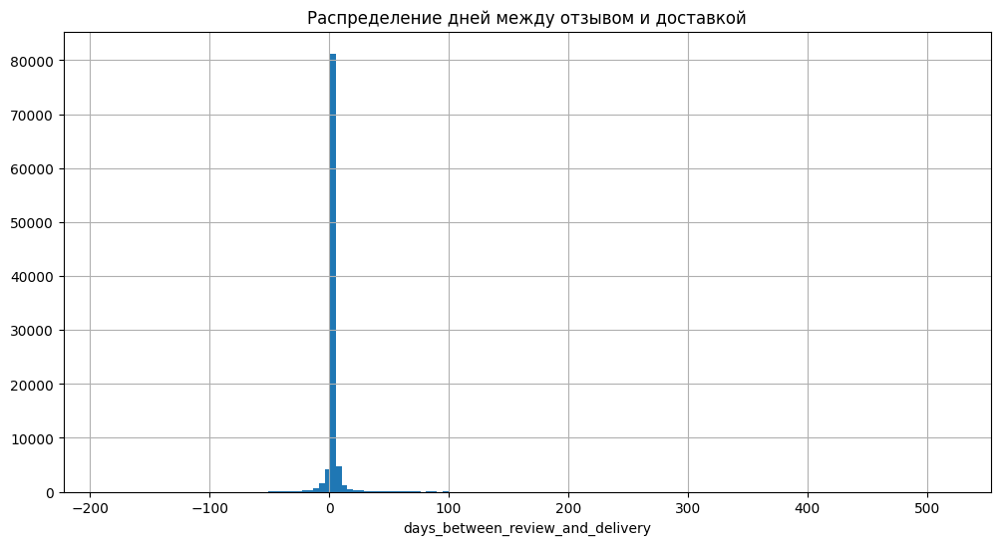

In [92]:
plt.figure(figsize = (12,6))
days_between_review_and_delivery_score['days_between'].hist(bins = 150)
plt.xlabel('days_between_review_and_delivery',fontsize = 10)
plt.title('Распределение дней между отзывом и доставкой')
plt.show()

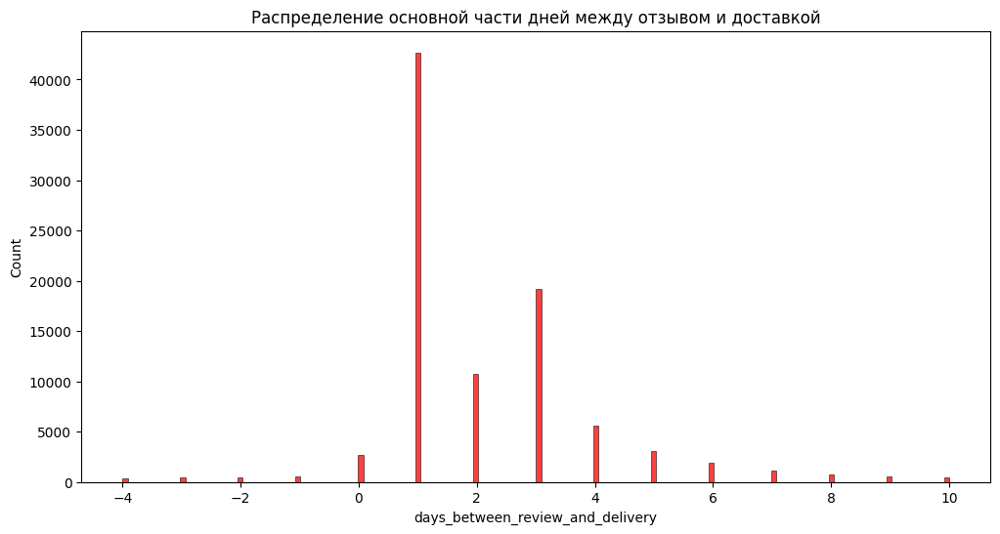

In [93]:
plt.figure(figsize = (12,6))
sns.histplot(days_between_review_and_delivery_score\
             .query('(days_between > days_between.quantile(0.03)) and (days_between < days_between.quantile(0.97))')['days_between'],color = 'red')
plt.xlabel('days_between_review_and_delivery',fontsize = 10)
plt.title('Распределение основной части дней между отзывом и доставкой')
plt.show()

Проверим, влиет ли разница между временем написания отзыва и временем доставки на оценку, посмотрим на распределение дней между ревью и доставкой основной части отзывов с разбивокой по review_score 

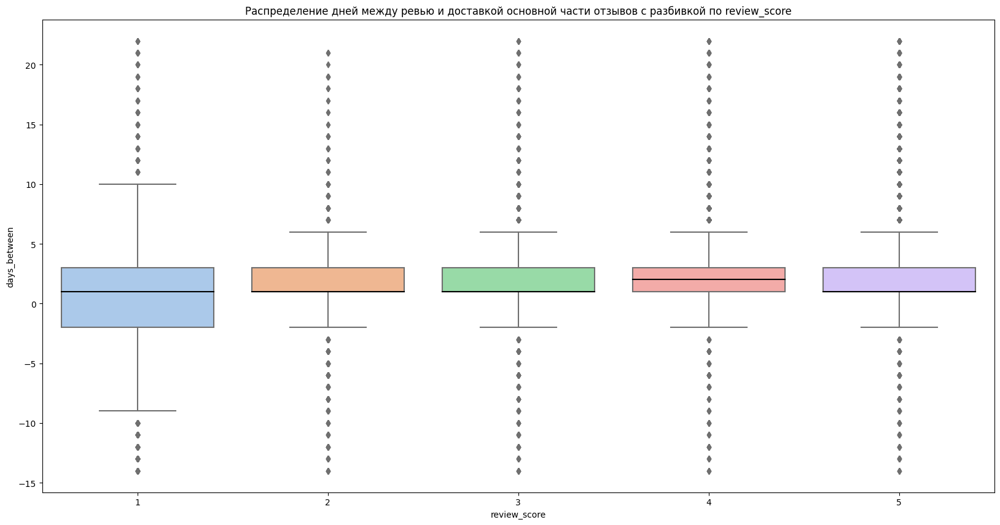

In [94]:
plt.figure(figsize = (20,10))
plt.title('Распределение дней между ревью и доставкой основной части отзывов с разбивкой по review_score')
sns.boxplot(data = days_between_review_and_delivery_score.query('(days_between > days_between.quantile(0.01)) and (days_between < days_between.quantile(0.99))'),
            y = 'days_between', x = 'review_score',medianprops={"color": "black"}, palette = 'pastel' )
plt.show()

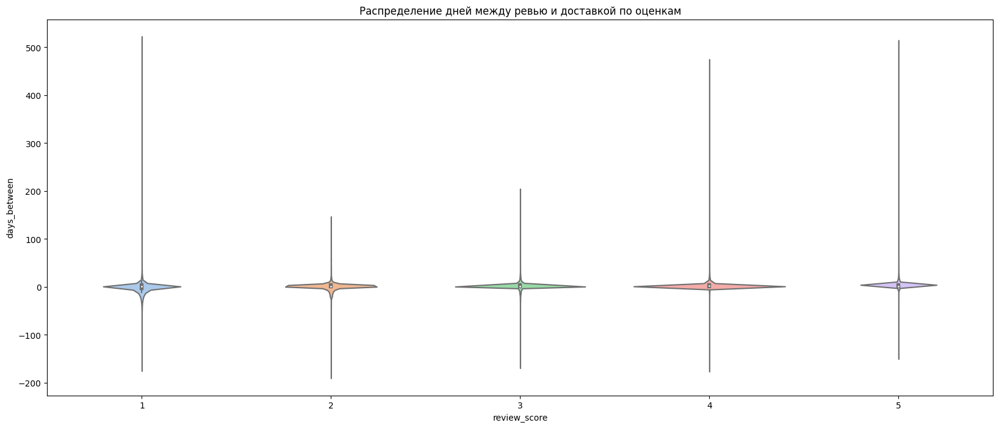

In [95]:
plt.figure(figsize = (20,8))
sns.violinplot(data = days_between_review_and_delivery_score,y = 'days_between', x = 'review_score', palette = 'pastel' )
plt.title('Распределение дней между ревью и доставкой по оценкам')
plt.show()

Как можно заметить, время, прошедшее между отправлением отзыва и доставкой заказа не сильно влияет на оценку, даже заказы, которые еще не были получены, получают оценку 5, большое прошедшее время характерно либо для очень плохих (1), либо для очень хороших оценок (4,5), хотя в любом случае в основном прошедшее время сконцентрировано в отрезке от -10 до 20.У плохих оценок и самой лучшей оценки (1,2,5) дни более рассредоточены, у остальных оценок - львиная доля дней равна 1, то есть если у покупателя есть не критические замечания, то он отвечает в основном на следующий день. 

## Задание 14

Отобразите распределение оценок для заказов, которые были доставлены вовремя и которые пришли с опозданием. Насколько влияет факт опоздания на оценку?

In [96]:
review_score_in_time_delivery = pd.DataFrame()
review_score_in_time_delivery['in_time'] = orders[orders['order_status'] == 'delivered'].dropna(subset = ['order_delivered_customer_date'])\
.apply(lambda x: dateutil.parser.parse(str(x.order_estimated_delivery_date)).date() >= x.order_delivered_customer_date.date(), axis = 1)
review_score_in_time_delivery['order_id'] = orders[orders['order_status'] == 'delivered'].dropna(subset = ['order_delivered_customer_date'])['order_id']
review_score_in_time_delivery = pd.merge(review_score_in_time_delivery,order_reviews.groupby('order_id')\
                                         .agg({'review_score': lambda x : x.mean().round()}).reset_index(), on = 'order_id', how = 'left').dropna()

In [97]:
score_distributions  =  pd.DataFrame(index = [1.0,2.0,3.0,4.0,5.0], columns = ['in time','not in time'])
score_distributions['in time'] = review_score_in_time_delivery[review_score_in_time_delivery['in_time'] == True]['review_score']\
  .value_counts().sort_index()/len(review_score_in_time_delivery[review_score_in_time_delivery['in_time'] == True])
score_distributions['not in time'] = review_score_in_time_delivery[review_score_in_time_delivery['in_time'] == False]['review_score']\
  .value_counts().sort_index()/len(review_score_in_time_delivery[review_score_in_time_delivery['in_time'] == False])
score_distributions.applymap("{0:.2%}".format)

,in time,not in time
1.0,6.58%,53.69%
2.0,2.68%,8.74%
3.0,8.08%,10.81%
4.0,20.45%,10.22%
5.0,62.21%,16.53%


Опоздание очень сильно влияет на оценку, больше половины оценок у заказов, которые пришли с опозданием - единицы, в отличие от заказов, которые приходят вовремя, где вероятность высокой оценки больше 80%. Однако надо отметить также, что несмотря на высокую вероятность очень низкой оценки, все равно самая наилучшая оценка имеет достаточно большой процент в случае с задержкой заказа, то есть достаточно большая часть людей из тех, которые получили свой заказ с задержкой готовы закрыть на это глаза. 

## Задание 15

Изобразите зависимость между ценой заказа и числом дней между покупкой и доставкой с разбивкой по признаку "есть заказ из другого штата". Есть ли зависимость?

In [98]:
orders['order_cost'] = pd.merge(orders, order_price_statistic.reset_index(), on = 'order_id', how = 'left').apply(lambda x: x.price + x.freight_value, axis = 1)

In [99]:
order_items['seller_state'] = pd.merge(order_items, sellers, on = 'seller_id', how = 'left')['seller_state']

In [100]:
temp = order_items[['order_id','seller_state','customer_state']].copy()
temp['seller_from_customer_state'] = (temp['seller_state'] == temp['customer_state'])
temp = temp.groupby('order_id').agg({'seller_from_customer_state':'sum','seller_state':'nunique'}).reset_index()
temp['has_product_from_other_state'] = (temp['seller_state'] - temp['seller_from_customer_state']) >= 1

In [101]:
orders['order_purchase_timestamp'] = orders['order_purchase_timestamp'].apply(lambda x : dateutil.parser.parse(str(x)))
orders['days_between_delivery_and_purchase'] = orders\
        .apply(lambda x : (x.order_delivered_customer_date.date() -  x.order_purchase_timestamp.date()).days if not pd.isnull(x.order_delivered_customer_date) else np.NaN, axis = 1)
orders = pd.merge(orders,temp[['order_id','has_product_from_other_state']], on = 'order_id', how = 'left')

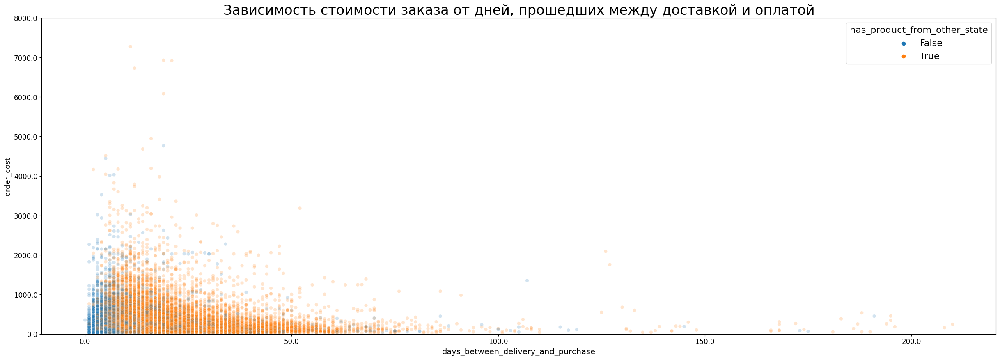

In [105]:
plt.figure(figsize = (30,10))
ax = sns.scatterplot(data = orders[['order_cost','days_between_delivery_and_purchase','has_product_from_other_state']].dropna(), 
y = 'order_cost', x = 'days_between_delivery_and_purchase', hue = 'has_product_from_other_state',alpha=0.2)
ax.set_ylim((0,8000))
ax.set_title('Зависимость стоимости заказа от дней, прошедших между доставкой и оплатой', fontsize = 24)
ax.legend(title = 'has_product_from_other_state', title_fontsize = 16, fontsize = 16)
ax.set_xlabel('days_between_delivery_and_purchase',fontsize = 14)
ax.set_ylabel('order_cost',size = 13)
ax.set_xticklabels(ax.get_xticks(),size = 12)
ax.set_yticklabels(ax.get_yticks(),size = 12)
plt.show()

## Задание 16 

Отобразите на карте все точки продавцов (если они находятся в одном месте, то необходимо отметить кол-во)

Где больше всего продавцов находится?

In [106]:
geolocation_new = geolocation.groupby('geolocation_zip_code_prefix').agg({'geolocation_lat':'mean','geolocation_lng':'mean'}).reset_index()

In [107]:
seller_location = pd.merge(sellers[['seller_id','seller_zip_code_prefix']],geolocation_new[['geolocation_zip_code_prefix','geolocation_lat','geolocation_lng']]\
                           .rename(columns = {'geolocation_zip_code_prefix':'seller_zip_code_prefix'}),on = 'seller_zip_code_prefix',how = 'left')
seller_location = seller_location.groupby(['geolocation_lat','geolocation_lng']).agg({'seller_id':'count'})
seller_location = seller_location.reset_index().rename(columns = {'seller_id':'number_of_sellers'})

In [108]:
fig = go.Figure(go.Scattermapbox(lat=seller_location['geolocation_lat'],
                                 mode =  "markers+text", 
                                 lon=seller_location['geolocation_lng'], 
                                 text=seller_location['number_of_sellers'].apply(str),
                                 marker = dict(size = seller_location['number_of_sellers']*7/seller_location['number_of_sellers']),
                                 marker_opacity=0.5, textposition = 'bottom right'))
fig.update_layout(mapbox_style="carto-positron",mapbox=dict(center = go.layout.mapbox.Center(lat=-15.50, lon=-47.55), zoom=4), title = 'Расположение продавцов')
fig.update_layout(margin={"r":0,"t":50,"l":0,"b":0})
fig.show()

Больше всего продавцов находятся около столицы - Рио-де-Жанейро, возле город Сан-Паулу, к слову, самого населенного в Бразилии.

## Задание 17

Определите топ-5 продавцов, которые чаще всего отсылают свою посылку в другие регионы и визуализируйте их отсылки

Выделим топ-5 продавцов, у которых самая большая частота отсылок в другие регионы, если продавцов окажется больше 5, выделим те, у кого больше посылок, отправлнных в другой регион численно

In [109]:
sellers_deliver_in_another_state = order_items.groupby(['order_id','seller_id']).agg({'customer_state':'first','seller_state':'first','customer_id':'first'})
top_sellers = sellers_deliver_in_another_state.apply(lambda x: x.customer_state != x.seller_state,axis = 1).reset_index().groupby('seller_id').agg({0:['mean','sum']}).sort_values(by = [(0,'mean'),(0,'sum')], ascending = False).rename(columns = {(0,'mean'):'frequency',(0,'sum'):'number'}).head(5).index.to_list()
top_sellers

['2dee2ce60de9709b1a24083217181a1f',
 '1ce3ae5a399804d1a87e706f8a813c3e',
 '83deb69e889cf80f82be1dc6d5f2d486',
 'f62d7bb4a613ec758a03342d46b580b2',
 '38e679b9e0064cd94c6f035707344dae']

In [110]:
customers = customers.merge(geolocation_new, left_on = ['customer_zip_code_prefix'],right_on = ['geolocation_zip_code_prefix'], how = 'left' )

In [111]:
sellers = pd.merge(sellers.rename(columns = {'seller_zip_code_prefix':'geolocation_zip_code_prefix'}),
                   geolocation_new[['geolocation_zip_code_prefix','geolocation_lat','geolocation_lng']], on = 'geolocation_zip_code_prefix', how = 'left' )

In [112]:
sellers_deliver_in_another_state = sellers_deliver_in_another_state.reset_index()
top_sellers_deliver_in_another_state = sellers_deliver_in_another_state[sellers_deliver_in_another_state['seller_id'].isin(top_sellers)].copy()

In [113]:
top_sellers_deliver_in_another_state = pd.merge(top_sellers_deliver_in_another_state,
                                                sellers[['seller_id','geolocation_lat','geolocation_lng']], on = 'seller_id', how = 'left')

In [114]:
top_sellers_deliver_in_another_state = top_sellers_deliver_in_another_state.rename(columns = {'geolocation_lat':'seller_geolocation_lat','geolocation_lng':'seller_geolocation_lng'})

In [115]:
top_sellers_deliver_in_another_state = pd.merge(top_sellers_deliver_in_another_state,customers[['customer_id','geolocation_lat','geolocation_lng']], on = 'customer_id', how = 'left')

In [116]:
top_sellers_deliver_in_another_state = top_sellers_deliver_in_another_state.rename(columns = {'geolocation_lat':'customer_geolocation_lat','geolocation_lng':'customer_geolocation_lng'})

In [117]:
fig = go.Figure()
colors = ['red','green','black','pink','blue']
for i in range(len(top_sellers_deliver_in_another_state)):
  ind = top_sellers.index(top_sellers_deliver_in_another_state.iloc[i]['seller_id'])
  fig.add_trace(go.Scattermapbox(mode = 'lines',lon = top_sellers_deliver_in_another_state.iloc[i][['seller_geolocation_lng','customer_geolocation_lng']],
                                 lat = top_sellers_deliver_in_another_state.iloc[i][['seller_geolocation_lat','customer_geolocation_lat']],name = '',line = dict(color = colors[ind])))
  fig.add_trace(go.Scattermapbox(mode = 'markers',lon = top_sellers_deliver_in_another_state.iloc[i][['seller_geolocation_lng']],
                                 lat = top_sellers_deliver_in_another_state.iloc[i][['seller_geolocation_lat']],name = '',marker=dict(size = 9,color = 'purple')))
fig.update_layout(showlegend = False,margin = {'l':0,'t':0,'b':0,'r':0}, mapbox = dict(center = go.layout.mapbox.Center(lat=-15.50, lon=-47.55), zoom=4), mapbox_style = "carto-positron")
fig.show()